In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
height = 800
kaggle = True
data_path = 'C:/Users/Administrator/life_expectancy_dataset.csv'

In [9]:
df_data = pd.read_csv(data_path, sep=';', decimal=',')
df_data.head()

,country_code,country_name,region,sub-region,intermediate-region,year,life_expectancy_women,life_expectancy_men
0,AFG,AFGANISTÁN,ASIA,SOUTHERN ASIA,NaN,1960,33.28,31.87
1,AFG,AFGANISTÁN,ASIA,SOUTHERN ASIA,NaN,1961,33.81,32.41
2,AFG,AFGANISTÁN,ASIA,SOUTHERN ASIA,NaN,1962,34.30,32.88
3,AFG,AFGANISTÁN,ASIA,SOUTHERN ASIA,NaN,1963,34.77,33.35
4,AFG,AFGANISTÁN,ASIA,SOUTHERN ASIA,NaN,1964,35.25,33.83


In [11]:
df_data.describe()

,year,life_expectancy_women,life_expectancy_men
count,13545.000000,13545.000000,13545.000000
mean,1991.000000,64.517931,59.653992
std,18.184914,17.778717,16.444545
min,1960.000000,0.000000,0.000000
25%,1975.000000,57.830000,53.850000
50%,1991.000000,69.590000,63.950000
75%,2007.000000,76.050000,69.920000
max,2022.000000,88.060000,83.350000


In [15]:
df_data = df_data[(df_data['life_expectancy_women'] > 0) | (df_data['life_expectancy_men'] > 0)]
df_data.describe()

,year,life_expectancy_women,life_expectancy_men
count,12974.000000,12974.000000,12974.000000
mean,1991.176969,67.357436,62.279430
std,18.155668,11.777881,10.899644
min,1960.000000,12.720000,10.050000
25%,1975.000000,59.800000,55.582500
50%,1991.000000,70.410000,64.600000
75%,2007.000000,76.280000,70.160000
max,2022.000000,88.060000,83.350000


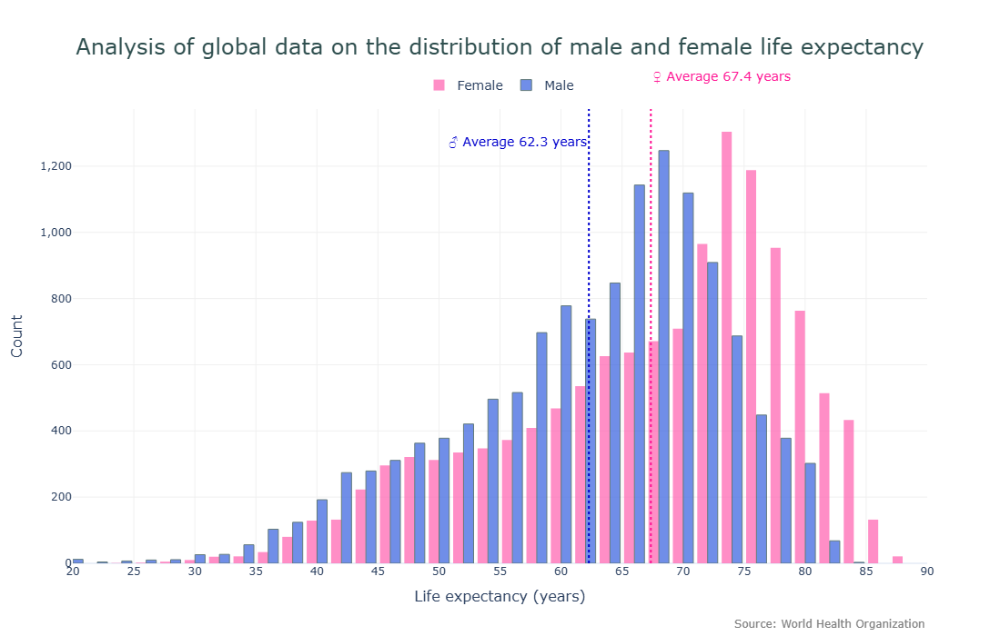

In [23]:
women_data = df_data['life_expectancy_women'].dropna().clip(20,90)

men_data = df_data['life_expectancy_men'].dropna().clip(20,90)

# Create a two-color histogram

fig = go.Figure()

# Female Histogram (Adjust Column Width)

fig.add_trace(go.Histogram(
    x=women_data,
    name='Female',
    marker_color='#FF69B4',
    opacity=0.75,
    nbinsx=30,  # Optimize the number of bins
    xbins=dict(size=2),  # Specify bin width explicitly
    hoverinfo='x+y',
    hovertemplate='<b>Female</b> <br>Age: %{x} <br>Age: %{y}<extra></extra>'
))

# Male Histogram (Add Marginal Line)

fig.add_trace(go.Histogram(
    x=men_data,
    name='Male',
    marker_color='#4169E1',
    opacity=0.75,
    nbinsx=30,
    xbins=dict(size=2),
    hoverinfo='x+y',
    hovertemplate='<b>Male</b> <br>Age: %{x} <br>Age: %{y}<extra></extra>',
    marker_line=dict(width=1, color='DarkSlateGrey')  # Add border line
))

# Calculate statistics

avg_women = women_data.mean()

avg_men = men_data.mean()

# Add dynamically positioned average line (to prevent text from overlapping)

fig.add_vline(
    x=avg_women, 
    line=dict(width=2, dash='dot', color='#FF1493'),
    annotation=dict(
        text=f'♀ Average {avg_women:.1f} years',
        yanchor='bottom',
        y=1.05,  # Positioned above the chart
        xanchor='left',
        font=dict(size=14, color='#FF1493')
    )
)

fig.add_vline(
    x=avg_men, 
    line=dict(width=2, dash='dot', color='#0000CD'),
    annotation=dict(
        text=f'♂ Average {avg_men:.1f} years',
        yanchor='top',
        y=0.95,  # Positioned below the chart
        xanchor='right',
        font=dict(size=14, color='#0000CD')
    )
)

# Advanced layout configuration

fig.update_layout(
    title=dict(
        text='Analysis of global data on the distribution of male and female life expectancy<br><sup></sup>',
        x=0.5,
        xanchor='center',
        font=dict(size=24, color='#2F4F4F')
    ),
    xaxis=dict(
        title='Life expectancy (years)',
        title_font=dict(size=16),
        tickmode='linear',
        dtick=5,  # Fixed tick interval
        range=[20, 90],  # Specify the coordinate range
        gridcolor='#F0F0F0'
    ),
    yaxis=dict(
        title='Count',
        title_font=dict(size=16),
        tickformat=',',  # Thousand separator
        gridcolor='#F0F0F0'
    ),
    bargap=0.15,  # Bar gap
    bargroupgap=0.03,
    height=700,
    width=1200,  # Increase the width
    template='plotly_white',
    margin=dict(t=120, b=80),  # Adjust margins
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5,
        font=dict(size=14)
    )
)

# Add custom annotations

fig.add_annotation(
    text="Source: World Health Organization",
    xref="paper", yref="paper",
    x=1, y=-0.15,
    showarrow=False,
    font=dict(size=12, color="gray")
)

# Display charts

fig.show()


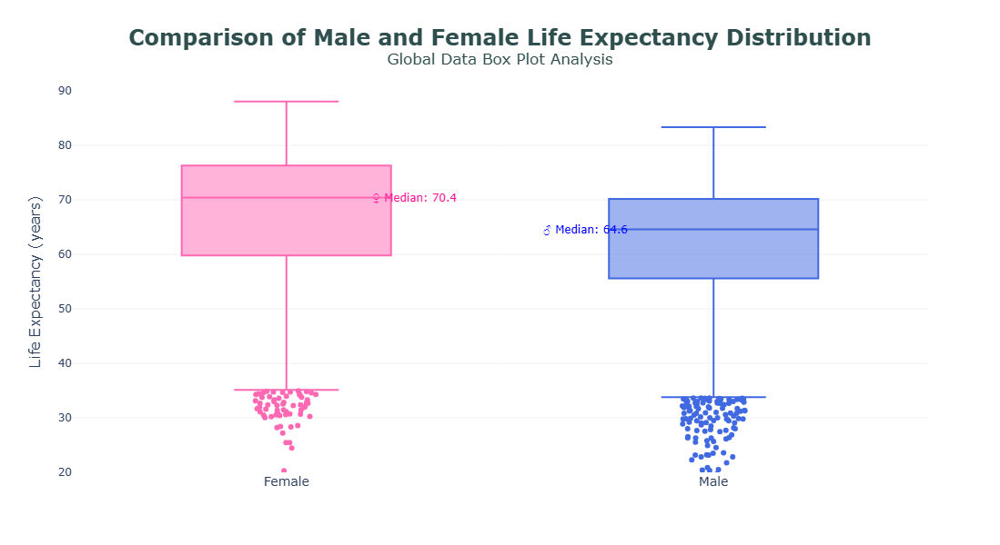

In [26]:
# Create a box plot object
fig = go.Figure()

# Add female box plot
fig.add_trace(go.Box(
    y=df_data['life_expectancy_women'],
    name='Female',
    marker_color='#FF69B4',
    boxpoints='outliers',  # Show only outliers
    line=dict(width=2),
    hoverinfo='y',
    jitter=0.3  # Spread of outliers
))

# Add male box plot
fig.add_trace(go.Box(
    y=df_data['life_expectancy_men'],
    name='Male',
    marker_color='#4169E1',
    boxpoints='outliers',
    line=dict(width=2),
    hoverinfo='y',
    jitter=0.3
))

# Calculate statistics
median_women = df_data['life_expectancy_women'].median()
median_men = df_data['life_expectancy_men'].median()

# Add median line annotations
fig.add_annotation(
    x=0.3, y=median_women,
    text=f'♀ Median: {median_women:.1f}',
    showarrow=False,
    font=dict(color='#FF1493', size=12)
)
fig.add_annotation(
    x=0.7, y=median_men,
    text=f'♂ Median: {median_men:.1f}',
    showarrow=False,
    font=dict(color='#0000FF', size=12)
)

# Beautify the layout
fig.update_layout(
    title=dict(
        text='<b>Comparison of Male and Female Life Expectancy Distribution</b><br><sup>Global Data Box Plot Analysis</sup>',
        x=0.5,
        font=dict(size=24, color='#2F4F4F')
    ),
    yaxis=dict(
        title='Life Expectancy (years)',
        title_font=dict(size=16),
        gridcolor='#F0F0F0',
        range=[20,90]
    ),
    xaxis=dict(
        tickfont=dict(size=14)
    ),
    template='plotly_white',
    height=600,
    width=1000,
    margin=dict(t=100),
    showlegend=False
)

fig.show()


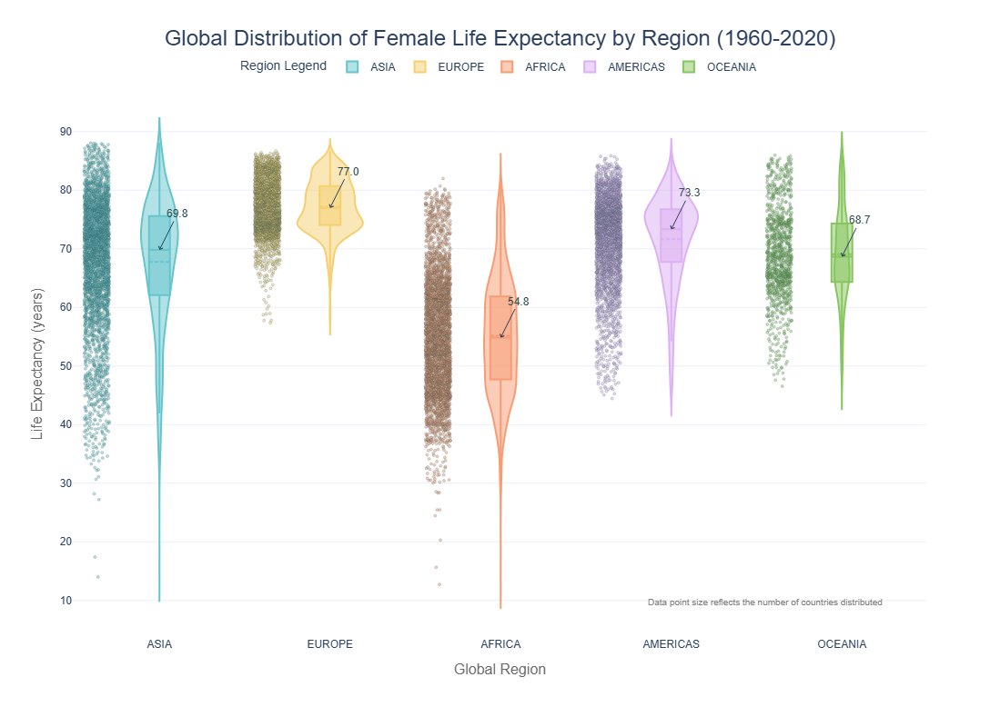

In [28]:
import pandas as pd
import plotly.express as px

# Create a violin-box plot combination with data distribution
fig = px.violin(
    df_data.dropna(subset=['life_expectancy_women']),
    x='region',
    y='life_expectancy_women',
    color='region',
    box=True,
    points="all",
    hover_data=['country_name', 'year'],
    title='Global Distribution of Female Life Expectancy by Region (1960-2020)',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    labels={'life_expectancy_women': 'Life Expectancy (years)', 'region': 'Global Region'}
)

# Add statistical annotations
region_means = df_data.groupby('region')['life_expectancy_women'].median().reset_index()
for i, row in region_means.iterrows():
    fig.add_annotation(
        x=row['region'],
        y=row['life_expectancy_women'],
        text=f"{row['life_expectancy_women']:.1f}",
        showarrow=True,
        arrowhead=4,
        arrowsize=1,
        ax=20,
        ay=-40,
        font=dict(size=12, color='#2F4F4F')
    )

# Updated layout configuration (key fix)
fig.update_layout(
    height=800,
    width=1200,
    template='plotly_white',
    font_family="Arial",
    title_font_size=24,
    title_x=0.5,
    xaxis=dict(  # Fixed parentheses closure
        title='Global Region',
        title_font=dict(size=16, color='#696969')
    ),
    yaxis=dict(  # Fixed parentheses closure
        title='Life Expectancy (years)',
        title_font=dict(size=16, color='#696969')
    ),
    margin=dict(t=100, b=100),
    legend=dict(
        title='Region Legend',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)  # Completed closing parentheses

# Adjust the violin plot style
fig.update_traces(
    marker=dict(size=3, opacity=0.5, line=dict(width=0.5, color='DarkSlateGrey')),
    meanline_visible=True,
    scalemode='count'
)

# Add dynamic annotation
fig.add_annotation(
    text="Data point size reflects the number of countries distributed",
    xref="paper", yref="paper",
    x=0.95, y=0.05,
    showarrow=False,
    font=dict(size=10, color="gray")
)

fig.show()


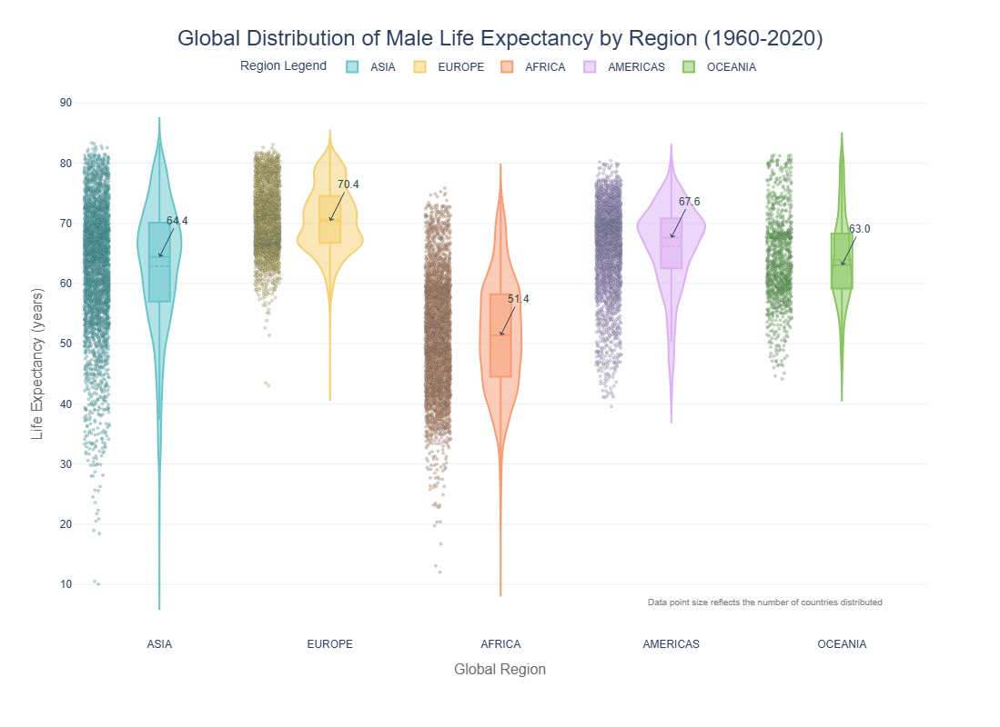

In [30]:
import pandas as pd
import plotly.express as px

# Create a violin-box plot combination with data distribution
fig = px.violin(
    df_data.dropna(subset=['life_expectancy_men']),
    x='region',
    y='life_expectancy_men',
    color='region',
    box=True,
    points="all",
    hover_data=['country_name', 'year'],
    title='Global Distribution of Male Life Expectancy by Region (1960-2020)',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    labels={'life_expectancy_men': 'Life Expectancy (years)', 'region': 'Global Region'}
)

# Add statistical annotations
region_means = df_data.groupby('region')['life_expectancy_men'].median().reset_index()
for i, row in region_means.iterrows():
    fig.add_annotation(
        x=row['region'],
        y=row['life_expectancy_men'],
        text=f"{row['life_expectancy_men']:.1f}",
        showarrow=True,
        arrowhead=4,
        arrowsize=1,
        ax=20,
        ay=-40,
        font=dict(size=12, color='#2F4F4F')
    )

# Updated layout configuration (key fix)
fig.update_layout(
    height=800,
    width=1200,
    template='plotly_white',
    font_family="Arial",
    title_font_size=24,
    title_x=0.5,
    xaxis=dict(  # Fixed parentheses closure
        title='Global Region',
        title_font=dict(size=16, color='#696969')
    ),
    yaxis=dict(  # Fixed parentheses closure
        title='Life Expectancy (years)',
        title_font=dict(size=16, color='#696969')
    ),
    margin=dict(t=100, b=100),
    legend=dict(
        title='Region Legend',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)  # Completed closing parentheses

# Adjust the violin plot style
fig.update_traces(
    marker=dict(size=3, opacity=0.5, line=dict(width=0.5, color='DarkSlateGrey')),
    meanline_visible=True,
    scalemode='count'
)

# Add dynamic annotation
fig.add_annotation(
    text="Data point size reflects the number of countries distributed",
    xref="paper", yref="paper",
    x=0.95, y=0.05,
    showarrow=False,
    font=dict(size=10, color="gray")
)

fig.show()


In [34]:
import plotly.express as px

# Get the data for the latest year
latest_year = df_data['year'].max()
df_latest = df_data[df_data['year'] == latest_year].dropna(subset=['life_expectancy_women'])

# Create an enhanced map
fig = px.choropleth(
    df_latest,
    locations="country_code",
    locationmode="ISO-3",
    color="life_expectancy_women",
    hover_name="country_name",
    hover_data=['region', 'sub-region', 'year'],  # Enhanced hover information
    title=f"<b>Global Distribution of Female Life Expectancy at Birth</b><br>",
    labels={'life_expectancy_women': 'Life Expectancy (years)'},
    color_continuous_scale=px.colors.sequential.Plasma,  # Use Plasma color scale
    range_color=(50, 90),  # Fixed color range
    projection="natural earth",  # Use natural earth projection
    height=800
)

# Advanced layout configuration
fig.update_layout(
    margin={"r":20,"t":100,"l":20,"b":20},
    title_font_size=24,
    title_x=0.5,
    coloraxis_colorbar=dict(
        title="Life Expectancy (years)",
        thickness=20,
        len=0.75,
        yanchor="top",
        y=0.85,
        xanchor="left",
        x=0.85
    ),
    geo=dict(
        showframe=False,
        showcoastlines=True,
        coastlinecolor="lightgray",
        landcolor="whitesmoke",
        bgcolor="white"
    ),
    font_family="Microsoft YaHei"
)

# Add statistical annotation
global_avg = df_latest['life_expectancy_women'].mean()
fig.add_annotation(
    text=f"Global Female Life Expectancy: {global_avg:.1f} years",
    x=0.5, y=0.05,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=14, color="#2F4F4F")
)

# Add data source annotation
fig.add_annotation(
    text="Data Source: World Health Organization",
    x=0.5, y=0.01,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=10, color="gray")
)

# Display optimizations
fig.update_geos(
    lataxis_showgrid=True,
    lonaxis_showgrid=True,
    resolution=110  # Optimize geographic precision
)

# Enhance interactivity
fig.update_traces(
    hovertemplate="<b>%{hovertext}</b><br>"
                  "Region: %{customdata[0]}<br>"
                  "Sub-region: %{customdata[1]}<br>"
                  "Year: %{customdata[2]}<br>"
                  "Life Expectancy: %{z} years<extra></extra>"
)

if kaggle:
    fig.show(renderer='iframe_connected', config={'displayModeBar': True})
else:
    fig.show()


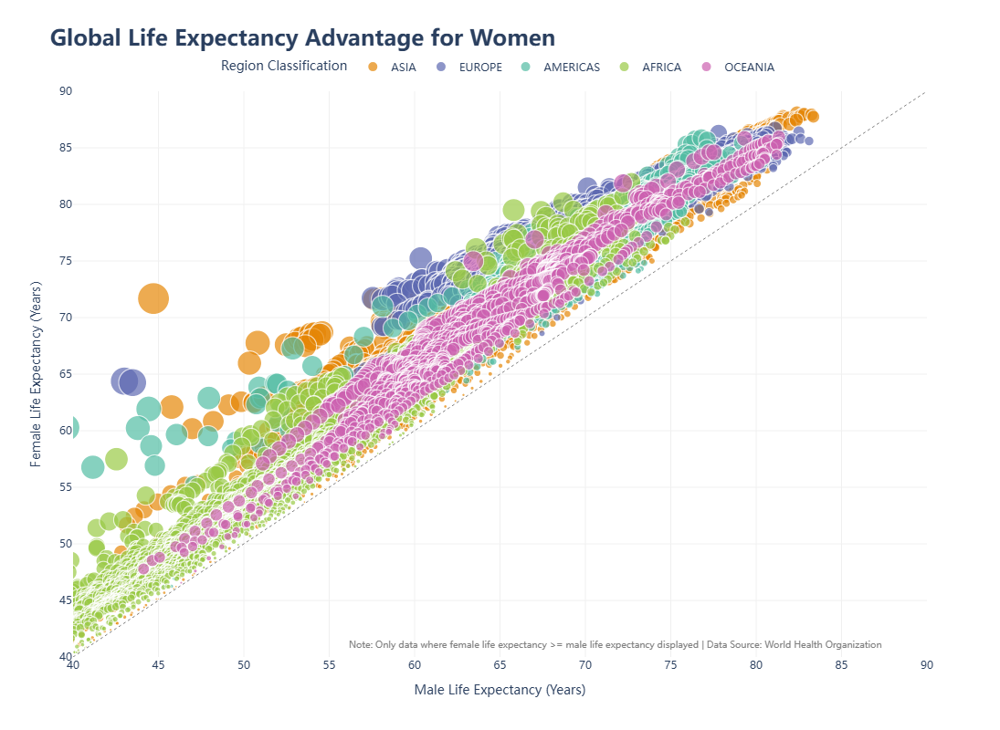

In [86]:
# Calculate life expectancy gap and handle outliers
df_data['life_expectancy_gap'] = df_data['life_expectancy_women'] - df_data['life_expectancy_men']

# Data cleaning strategy:
# Option 1: Keep negative gap but convert to absolute value (suitable for displaying absolute differences)
# df_data['life_expectancy_gap_absolute'] = df_data['life_expectancy_gap'].abs()

# Option 2: Filter negative gaps (focus on cases where women have the advantage)
df_clean = df_data.query('life_expectancy_gap >= 0').dropna(subset=['life_expectancy_gap']).sort_values('life_expectancy_gap', ascending=False)

# Create dynamic bubble chart (correct parameter format)
fig = px.scatter(
    df_clean,
    x='life_expectancy_men',
    y='life_expectancy_women',
    size='life_expectancy_gap',
    color='region',
    hover_name='country_name',
    hover_data=['year', 'sub-region'],  # Corrected to list format
    size_max=35,
    title='<b>Global Life Expectancy Advantage for Women</b><br>',
    #<sub>Bubble Size = Years Women Live Longer Than Men</sub>
    color_discrete_sequence=px.colors.qualitative.Vivid,
    labels={
        'life_expectancy_men': 'Male Life Expectancy (Years)',
        'life_expectancy_women': 'Female Life Expectancy (Years)',
        'region': 'Region',
        'life_expectancy_gap': 'Advantage in Years'
    },
    range_x=[40,90],  # Fixed coordinate range
    range_y=[40,90]
)

# Add reference line and annotation
fig.add_shape(
    type="line",
    x0=40, y0=40, x1=90, y1=90,
    line=dict(color="grey", width=1, dash="dot"),
    xref="x", yref="y"
)

# Advanced layout configuration
fig.update_layout(
    height=800,
    width=1200,
    template='plotly_white',
    font_family="Microsoft YaHei",
    title_font_size=24,
    xaxis=dict(
        dtick=5,
        gridcolor='#F0F0F0',
        title='Male Life Expectancy (Years)'
    ),
    yaxis=dict(
        dtick=5,
        gridcolor='#F0F0F0',
        title='Female Life Expectancy (Years)'
    ),
    legend=dict(
        title=dict(text='Region Classification'),
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    )
)

# Add data quality annotation
fig.add_annotation(
    text="Note: Only data where female life expectancy >= male life expectancy displayed | Data Source: World Health Organization",
    xref="paper", yref="paper",
    x=0.95, y=0.01,
    showarrow=False,
    font=dict(size=10, color="gray")
)

fig.show()


C:\Users\Administrator\AppData\Local\Temp\ipykernel_3540\241141726.py:14: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



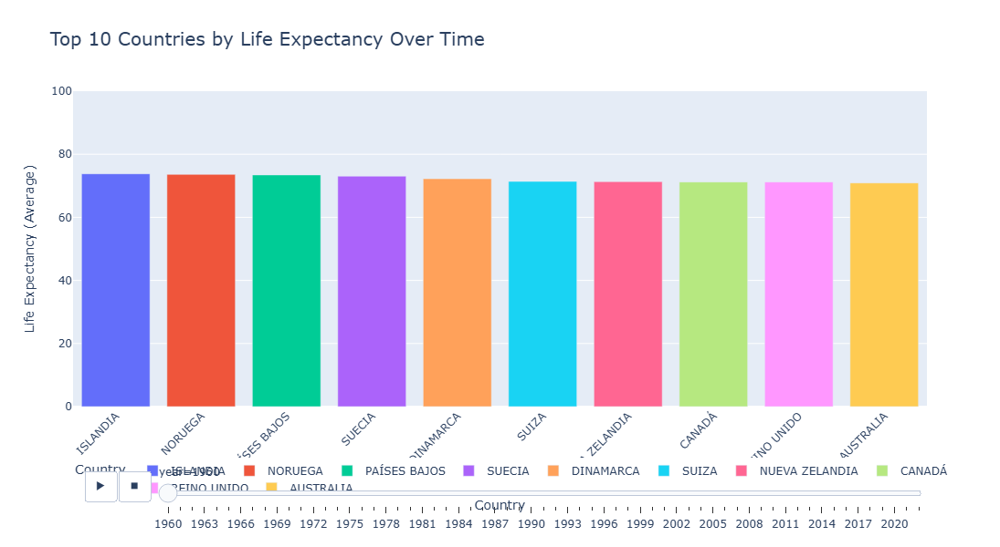

In [70]:
import pandas as pd
import plotly.express as px


df_data['life_expectancy_avg'] = (df_data['life_expectancy_women'] + df_data['life_expectancy_men']) / 2


df_data['short_country_name'] = df_data['country_name'].apply(lambda x: x[:15])


def top_countries_per_year(df, top_n=10):
    return (
        df.groupby("year", group_keys=False)
        .apply(lambda x: x.nlargest(top_n, "life_expectancy_avg"))
    )

df_top_countries = top_countries_per_year(df_data, top_n=10)


fig = px.bar(
    df_top_countries,
    x="short_country_name", 
    y="life_expectancy_avg",  
    color="short_country_name",  
    animation_frame="year",  
    animation_group="short_country_name",  
    labels={"life_expectancy_avg": "Life Expectancy (Average)", "short_country_name": "Country"},  
    title="Top 10 Countries by Life Expectancy Over Time",  
)


fig.update_layout(
    height=600,  
    width=1000,  
    yaxis=dict(title="Life Expectancy (Average)", range=[0, 100]), 
    xaxis=dict(title="Country", tickangle=-45),
    bargap=0.2,  
    title_font_size=20,  
    legend=dict(title="Country", orientation="h", yanchor="bottom", y=-0.3),  
)


fig.show()